ENV: celiac_env_3

In [1]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import plotly.express as px
from adjustText import adjust_text
from tqdm import tqdm
import gseapy as gp
import os
import warnings
from datetime import datetime
from scipy.stats import zscore
import scipy
from sklearn.decomposition import PCA
import math
from scipy.sparse import issparse
from statsmodels.stats.multitest import multipletests
from scipy.stats import ranksums
import scipy.stats
import dill
import session_info2

np.random.seed(1)

# import py_funcs
import plot_gsea

warnings.filterwarnings("ignore")

mpl.rcParams['pdf.fonttype'] = 42 # to edit text in Illustrator
mpl.rcParams['ps.fonttype'] = 42
plt.rcParams.update({
    "font.size": 14,    
    "axes.titlesize": 16,    
    "axes.labelsize": 14,  
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,  
    "legend.fontsize": 14
})

# cm = 1/2.54 # centimeters in inches
LOAD_ARIAL = True
if LOAD_ARIAL:
    # set the default font to Arial
    from matplotlib.font_manager import FontProperties, fontManager
    from matplotlib import rcParams
    # Path to Arial font
    arial_path = '/mnt/x/common/joint_projects/spatial_celiac/utils/Arial.ttf'

    # Define font properties with the specific path
    arial_font = FontProperties(fname=arial_path)
    fontManager.addfont(arial_path)

    # Set the font as the default for all text elements
    rcParams['font.family'] = arial_font.get_family()
    rcParams['font.sans-serif'] = [arial_font.get_name()]

In [2]:
fast_load = True
if fast_load:
    fast_load_prefix = "/mnt/d/celiac_files/"
else:   
    fast_load_prefix = ""

## Imports

In [3]:
pb_subfolder_path = os.getcwd()+"/pseudobulk_data/"
sample_annot_df = pd.read_csv(f"{pb_subfolder_path}sample_annotations.csv", index_col=0)
sample_annot_df

,Diagnosis,Sex,Age,Anti-tTG,VisiumHD,Flex
P109,Celiac,Female,5.0,79.0,True,False
P080,Celiac,Female,8.5,45.0,True,False
P076,Celiac,Female,5.5,250.0,True,True
P105,Celiac,Female,4.5,250.0,True,True
P054,Celiac,Male,5.5,250.0,True,True
P102,Celiac,Male,10.0,250.0,True,False
P116,Celiac,Male,10.0,250.0,False,True
P072,Celiac,Male,8.5,154.0,True,True
P004,Celiac,Male,11.5,250.0,True,True
P046,Control,Female,11.0,0.5,True,True


In [4]:
adata = sc.read_h5ad(fast_load_prefix+"10x_flex_all_samples_processed_bg.h5ad")
adata

AnnData object with n_obs × n_vars = 53270 × 18129
    obs: 'sample_name', 'batch', 'clinical_group', 'processing_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'log10_total_counts', 'leiden', 'cell_type_lvl1', 'cell_type_lvl2', 'epi_umap1', 'epi_umap2', 'entero_umap1', 'entero_umap2', 'stroma_umap1', 'stroma_umap2', 'epi_leiden', 'stroma_leiden', 'imm_leiden', 'stroma_umap_1', 'stroma_umap_2', 'immune_umap_1', 'immune_umap_2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-

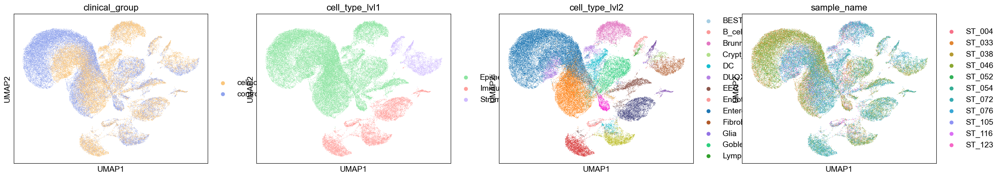

In [5]:
sc.pl.umap(adata, color=['clinical_group', 'cell_type_lvl1', 'cell_type_lvl2', 'sample_name'])

In [6]:
# export pseudobulk cell_type_lvl2
USE_LAYER = 'mat_norm'
for my_group in adata.obs['clinical_group'].unique():
    pb_lvl2_df = pd.DataFrame(index=adata.obs['cell_type_lvl2'].cat.categories, columns=adata.var_names)
    for ct in tqdm(adata.obs['cell_type_lvl2'].cat.categories):
        ct_adata = adata[(adata.obs['cell_type_lvl2'] == ct) & (adata.obs['clinical_group'] == my_group)]
        if issparse(ct_adata.layers[USE_LAYER]):
            ct_mean = np.array(ct_adata.layers[USE_LAYER].mean(axis=0)).flatten()
        else:
            ct_mean = ct_adata.layers[USE_LAYER].mean(axis=0)
        pb_lvl2_df.loc[ct,:] = ct_mean
    # transpose
    pb_lvl2_df = pb_lvl2_df.T
    # save
    pb_lvl2_df.to_csv(f"{pb_subfolder_path}pseudobulk_cell_type_lvl2_{my_group}_{USE_LAYER}.csv")

100%|██████████| 25/25 [00:00<00:00, 30.21it/s]


### Analyze level 1

In [7]:
# create dir for fig1 if not exists
cell_types_fig_save_path = os.getcwd()+"/figures/supp_fig_cell_types"
if not os.path.exists(cell_types_fig_save_path):
    os.makedirs(cell_types_fig_save_path)

fig1_save_path = os.getcwd()+"/figures/fig1"
if not os.path.exists(fig1_save_path):
    os.makedirs(fig1_save_path)

fig4_save_path = os.getcwd()+"/figures/fig4/"
if not os.path.exists(fig4_save_path):
    os.makedirs(fig4_save_path)

supp_metaplasia_save_path = os.getcwd()+"/figures/supp_metaplasia/"
if not os.path.exists(supp_metaplasia_save_path):
    os.makedirs(supp_metaplasia_save_path)

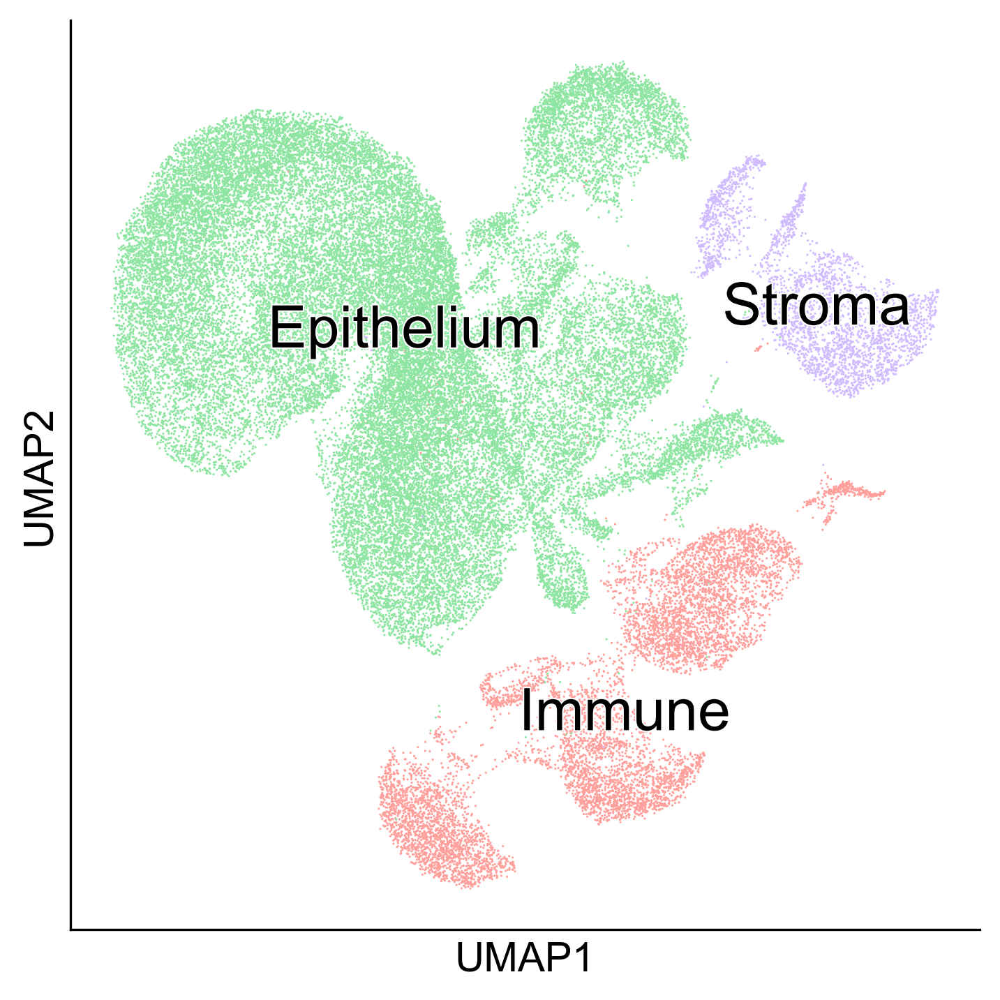

In [8]:
FIG_SIZE = (5, 5)
fig,ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
sc.pl.umap(adata, color=['cell_type_lvl1'], show=False,ax=ax, legend_loc='on data', legend_fontsize='x-large',legend_fontoutline=1)
plt.title("")
sns.despine()
plt.tight_layout()

# rasterize
ax.collections[0].set_rasterized(True)


plt.show()
# export pdf
fig.savefig(cell_types_fig_save_path+"/supp_fig_A_10x_flex_lvl1_celltypes_umap.pdf", bbox_inches='tight')

In [9]:
# add heat map of DGE genes
sc.tl.rank_genes_groups(adata, groupby='cell_type_lvl1', method='wilcoxon', layer='log_norm')


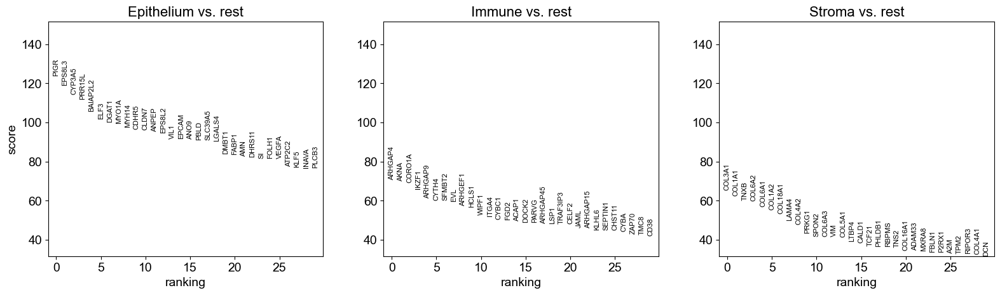

In [10]:
sc.pl.rank_genes_groups(adata, n_genes=30, groupby='cell_type_lvl1')

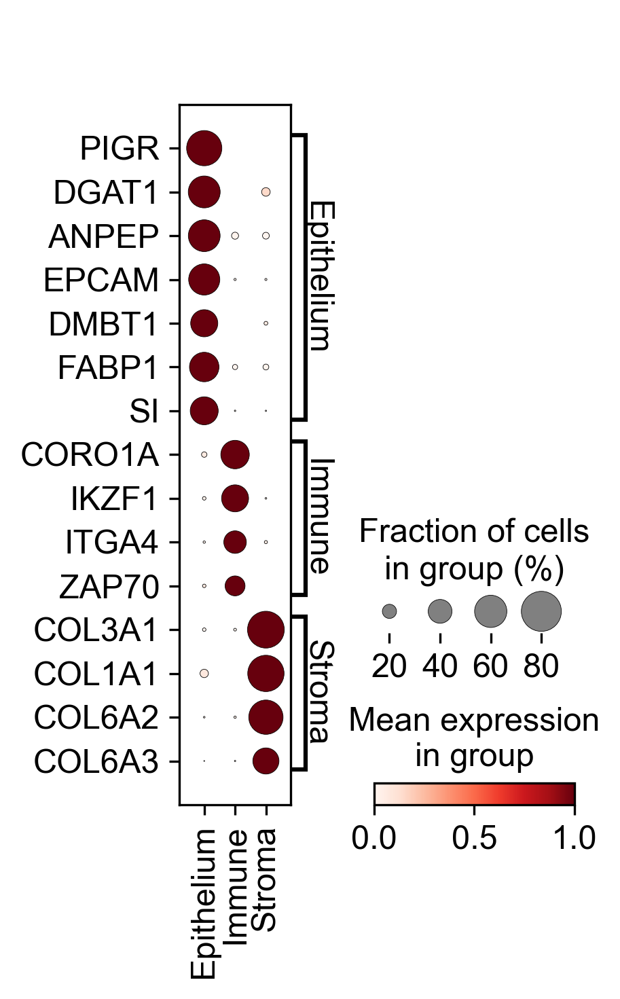

In [11]:
N_markers = 6
top_markers = {}
for cell_type in adata.obs['cell_type_lvl1'].cat.categories:
    markers_df = sc.get.rank_genes_groups_df(adata, group=cell_type)
    top_genes_N = markers_df['names'].head(N_markers).tolist()
    top_markers[cell_type] = top_genes_N

top_markers_list = []
for markers in top_markers.values():
    top_markers_list.extend(markers)

top_markers = {"Epithelium":["PIGR","DGAT1","ANPEP","EPCAM","DMBT1","FABP1","SI"],
               "Immune":["CORO1A","IKZF1","ITGA4","ZAP70",],
                "Stroma":["COL3A1","COL1A1","COL6A2","COL6A3"],
               }

colors_dict = {"Epithelium":"#85e29a","Stroma":"#d6c4ff","Immune":"#ff9f9b"}

fig,ax = plt.subplots(figsize=(2.5,5), dpi=300)
sc.pl.dotplot(adata, top_markers, groupby='cell_type_lvl1', layer='log_zscore',
standard_scale='var', cmap='Reds', swap_axes=True,ax=ax, show=False,)

export_path = f"{cell_types_fig_save_path}/supp_fig_10x_flex_lvl1_celltypes_marker_genes_dotplot.pdf"
plt.gcf().savefig(export_path, bbox_inches='tight', dpi=300)

plt.show()

In [12]:
# for each cell_type_lvl1: DGE cell_type_lvl1 celiac vs control
PN=1e-6
dge_dict = {}
EXP_THRESH = 1e-5
FC_THRESH = 2
Q_THRESH = 0.05
for ct in tqdm(adata.obs['cell_type_lvl1'].unique()):
    adata_ct = adata[adata.obs['cell_type_lvl1'] == ct].copy()
    adata_ct.obs['clinical_group'] = adata_ct.obs['clinical_group'].astype('category')
    mean_celiac = adata_ct[adata_ct.obs['clinical_group']=='celiac'].layers['mat_norm'].mean(axis=0)
    mean_control = adata_ct[adata_ct.obs['clinical_group']=='control'].layers['mat_norm'].mean(axis=0)
    # filter genes with low expression
    selected_genes = adata_ct.var_names[np.where(np.maximum(mean_celiac, mean_control).A1 > EXP_THRESH)[0]]
    adata_ct = adata_ct[:,selected_genes]
    # perform wilcoxon rank-sum test using scanpy
    sc.tl.rank_genes_groups(adata_ct, groupby='clinical_group', reference='control', method='wilcoxon', pts=True)
    dge_df = sc.get.rank_genes_groups_df(adata_ct, group='celiac')
    dge_df['nlogq'] = -np.log10(dge_df['pvals_adj'] + 1e-300)
    dge_df['significant'] = ( (dge_df['logfoldchanges'].abs() >= np.log2(FC_THRESH)) & (dge_df['pvals_adj'] <= Q_THRESH) )
    dge_dict[ct] = dge_df

100%|██████████| 3/3 [01:16<00:00, 25.44s/it]


In [13]:
dge_dict["Stroma"].to_csv(f"{pb_subfolder_path}dge_cell_type_lvl1_celiac_vs_control_Stroma.csv", index=False)

### Plot level 2 figures

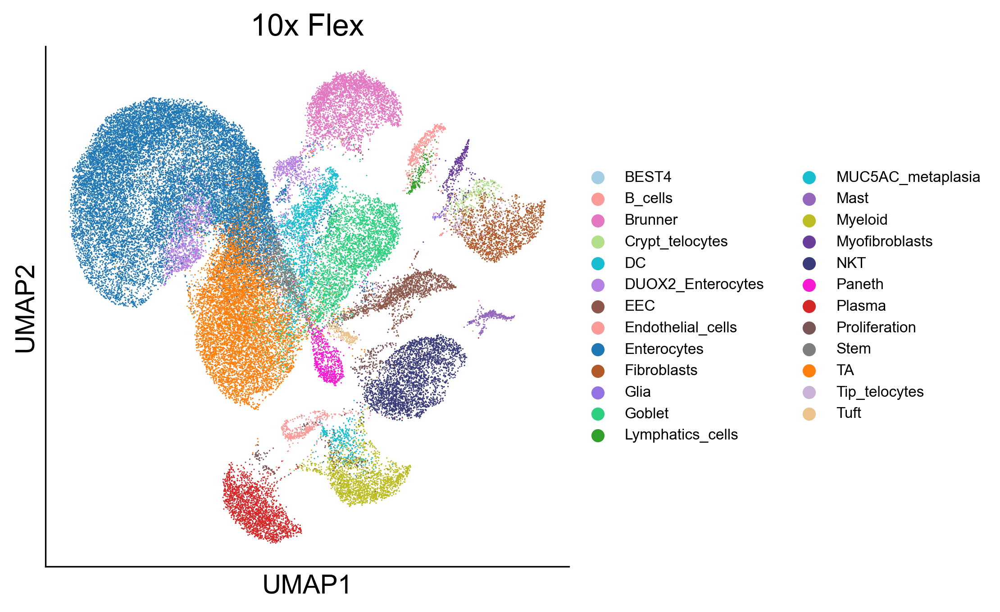

In [14]:
FIG_SIZE = (5, 5)
fig,ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
sc.pl.umap(adata, color=['cell_type_lvl2'], show=False,ax=ax, legend_fontsize=8,legend_fontoutline=1)

plt.title("10x Flex")

# rasterize axes
ax.collections[0].set_rasterized(True)

sns.despine()
# plt.tight_layout()
plt.show()

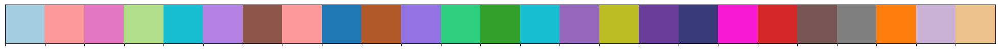

In [15]:
# create dataframe with cell_type names and colors
colors_df = pd.DataFrame({
    'cell_type_lvl2': adata.obs['cell_type_lvl2'].cat.categories,
    'color': adata.uns['cell_type_lvl2_colors']
})

# swap colors of TA and MUC5AC_metaplasia
ta_idx = colors_df[colors_df['cell_type_lvl2']=='TA'].index[0]
muc5ac_idx = colors_df[colors_df['cell_type_lvl2']=='MUC5AC_metaplasia'].index[0]
# change at the adata.uns as well
adata.uns['cell_type_lvl2_colors'][ta_idx], adata.uns['cell_type_lvl2_colors'][muc5ac_idx] = adata.uns['cell_type_lvl2_colors'][muc5ac_idx], adata.uns['cell_type_lvl2_colors'][ta_idx]

# plot the palette
sns.palplot(sns.color_palette(colors_df['color']))

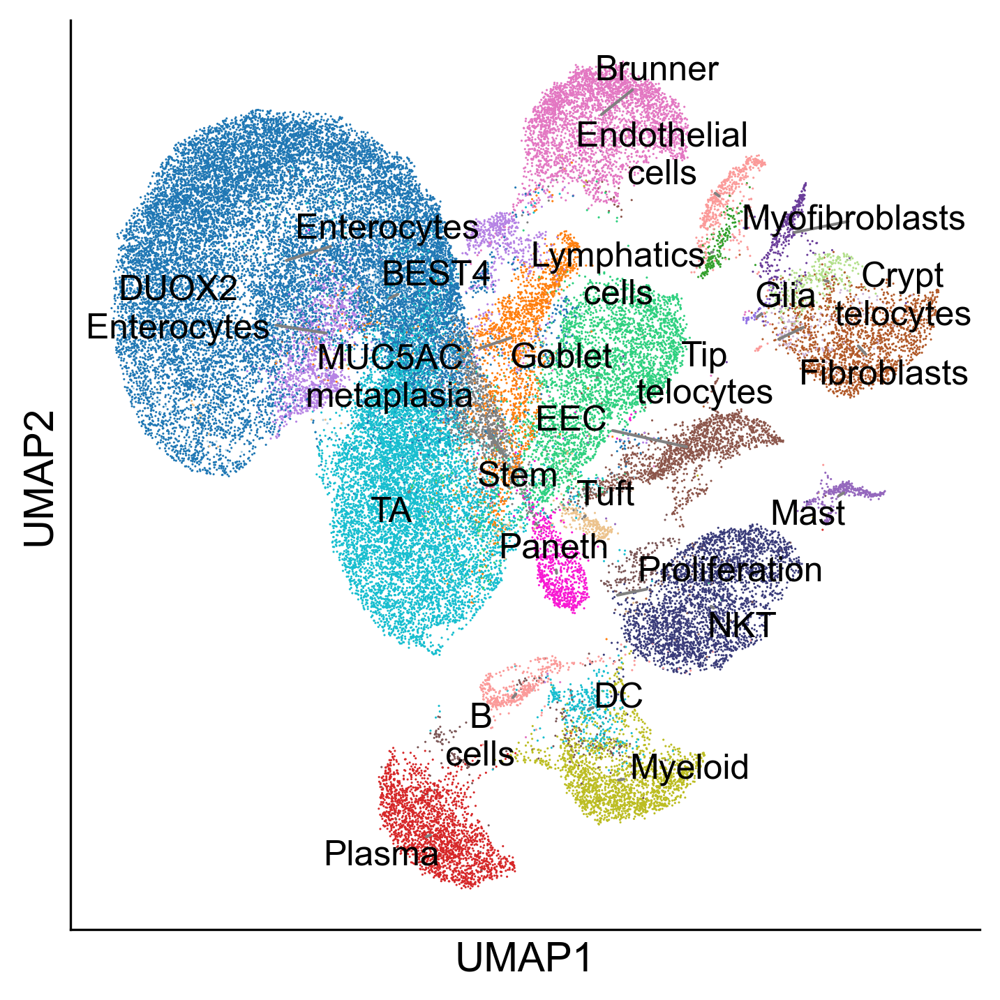

In [16]:
ADD_WHITE_OUTLINE = False
FIG_SIZE = (5, 5)
fig,ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
sc.pl.umap(adata, color=['cell_type_lvl2'], show=False,ax=ax, legend_loc=None, legend_fontsize=8,legend_fontoutline=1)

# swap the colors of "TA" and "EEC"
colors = adata.uns['cell_type_lvl2_colors']


# add texts of cell_type_lvl2
for cell_type in adata.obs['cell_type_lvl2'].unique():
    x = np.median(adata.obsm['X_umap'][adata.obs['cell_type_lvl2'] == cell_type, 0])
    y = np.median(adata.obsm['X_umap'][adata.obs['cell_type_lvl2'] == cell_type, 1])

    if ADD_WHITE_OUTLINE:
        ax.text(x, y, cell_type.replace("_", "\n"), fontsize=12, weight='bold', color='black', ha='center', va='center',
            path_effects=[mpl.patheffects.withStroke(linewidth=1, foreground='white')])
    else:
        ax.text(x, y, cell_type.replace("_", "\n"), fontsize=12, weight='bold', color='black', ha='center', va='center')

# use text adjust
adjust_text(ax.texts, arrowprops=dict(arrowstyle='-', color='gray'))

# use text adjust

plt.title("")

# rasterize axes
ax.collections[0].set_rasterized(True)

sns.despine()
plt.tight_layout()
plt.show()
# save figure
fig.savefig(fig1_save_path+"/fig_1D_cell_type_lvl2_umap.pdf", bbox_inches='tight')

In [17]:
print(f"There are {adata.n_obs} cells in the flex data")

There are 53270 cells in the flex data


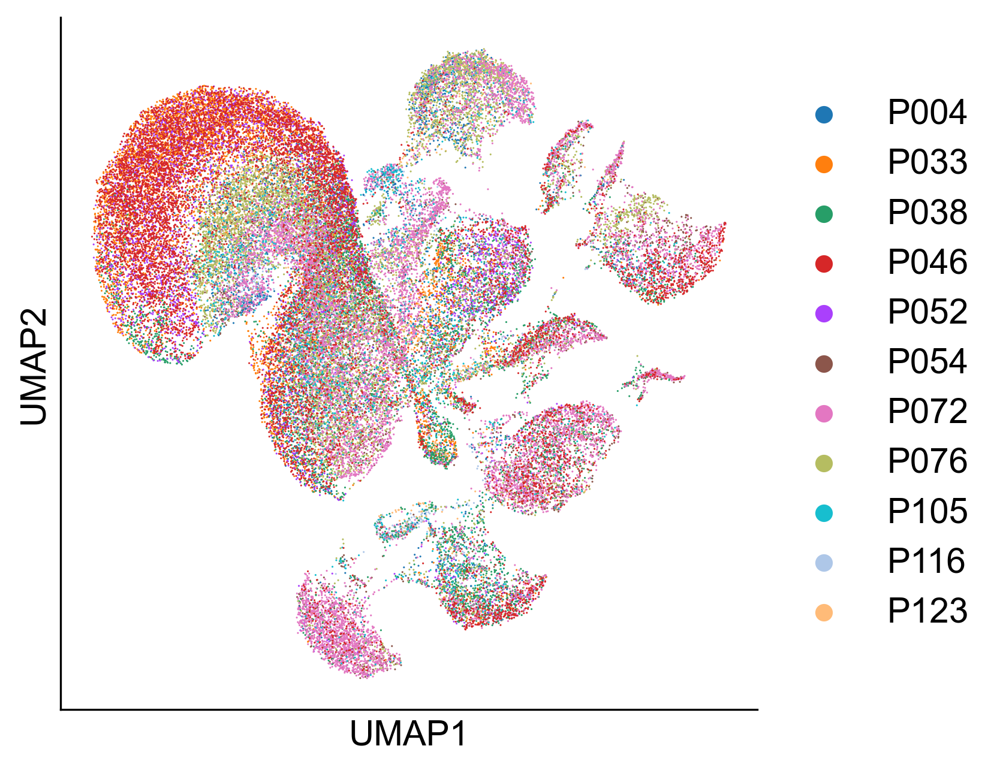

In [18]:
adata.obs['disp_sample_name'] = adata.obs['sample_name']
#replace "ST_" with "P"
adata.obs['disp_sample_name'] = adata.obs['disp_sample_name'].str.replace("ST_", "P")

fig,ax = plt.subplots(figsize=(5,5), dpi=300)
sc.pl.umap(adata, color=['disp_sample_name'],ax=ax,show=False)
ax.set_title("")
sns.despine()
plt.show()

# rasterize all collections in the plot
for coll in ax.collections:
    coll.set_rasterized(True)

fig.savefig(cell_types_fig_save_path+"/fig_S1_flex_umap_by_sample.pdf", bbox_inches='tight')

In [19]:
# perform DGE for cell_type_lvl2
sc.tl.rank_genes_groups(adata, groupby='cell_type_lvl2', method='wilcoxon', layer='log_norm', n_genes=adata.n_vars)
N_markers = 10
markers_dict = {}
for cell_type in adata.obs['cell_type_lvl2'].cat.categories:
    markers_df = sc.get.rank_genes_groups_df(adata, group=cell_type)
    top_markers = markers_df.head(N_markers)['names'].tolist()
    markers_dict[cell_type] = top_markers

# convert markers_dict to dataframe
markers_df = pd.DataFrame.from_dict(markers_dict, orient='index').transpose()

# Ensure the "supp_tables" directory exists
supp_tables_path = "supp_tables"
os.makedirs(supp_tables_path, exist_ok=True)

# Save the markers dataframe under the "supp_tables" directory
markers_df.to_csv(f"{supp_tables_path}/Supp_table_Flex_lvl2_markers.csv", index=False)

In [20]:
markers_df = sc.get.rank_genes_groups_df(adata, group='Tip_telocytes')
top_genes_N = markers_df['names'].head(N_markers).tolist()
top_genes_N

['COL1A1',
 'COL6A2',
 'COL6A1',
 'F3',
 'NRG1',
 'COL6A3',
 'COL3A1',
 'LAMA5',
 'SPON2',
 'COL1A2']

In [21]:
top_markers

['SH2D6',
 'TRPM5',
 'PTPN18',
 'AZGP1',
 'PSTPIP2',
 'HCK',
 'B4GALNT4',
 'AVIL',
 'TPM1',
 'RGS13']

In [22]:
ordered_cell_types = ["Enterocytes","TA","Stem","Paneth","Goblet","EEC","BEST4",
"MUC5AC_metaplasia","DUOX2_Enterocytes","Tuft","Brunner","Fibroblasts","Myofibroblasts",
"Crypt_telocytes","Tip_telocytes","Lymphatics_cells","Endothelial_cells","Glia",
"Plasma","NKT",'Myeloid',"DC","B_cells","Mast","Proliferation"]

In [23]:
N_markers = 2
top_markers = {}
for cell_type in ordered_cell_types:#adata.obs['cell_type_lvl2'].unique():
    markers_df = sc.get.rank_genes_groups_df(adata, group=cell_type)
    top_genes_N = markers_df['names'].head(N_markers).tolist()

    # check if top_gene_N already in the list, if so, get next genes
    existing_genes = set()
    for genes in top_markers.values():
        existing_genes.update(genes)
    unique_top_genes = []
    gene_idx = 0
    while len(unique_top_genes) < N_markers and gene_idx < len(markers_df):
        gene = markers_df['names'].iloc[gene_idx]
        if gene not in existing_genes:
            unique_top_genes.append(gene)
        gene_idx += 1
    top_genes_N = unique_top_genes

    top_markers[cell_type] = top_genes_N
    if cell_type == "Tip_telocytes":
        top_markers[cell_type].append("NRG1")
    if cell_type == "MUC5AC_metaplasia":
        top_markers[cell_type].append("MUC5AC")
    if cell_type == "BEST4":
        top_markers[cell_type].append("BEST4")
    if cell_type == "DUOX2_Enterocytes":
        top_markers[cell_type].append("DUOX2")

# delete "\nmarkers" from keys
# top_markers = {key.replace("\nmarkers",""): value for key, value in top_markers.items()}

# lvl2_abundances = adata.obs['cell_type_lvl2'].value_counts()
# Sort top_markers by the abundances of cell types in lvl2_abundances
# top_markers = {k: v for k, v in sorted(top_markers.items(), key=lambda item: lvl2_abundances[item[0]], reverse=True)}

top_markers_list = []
for markers in top_markers.values():
    top_markers_list.extend(markers)

# # if there is duplicates - remove them
# top_markers_list = list(dict.fromkeys(top_markers_list))


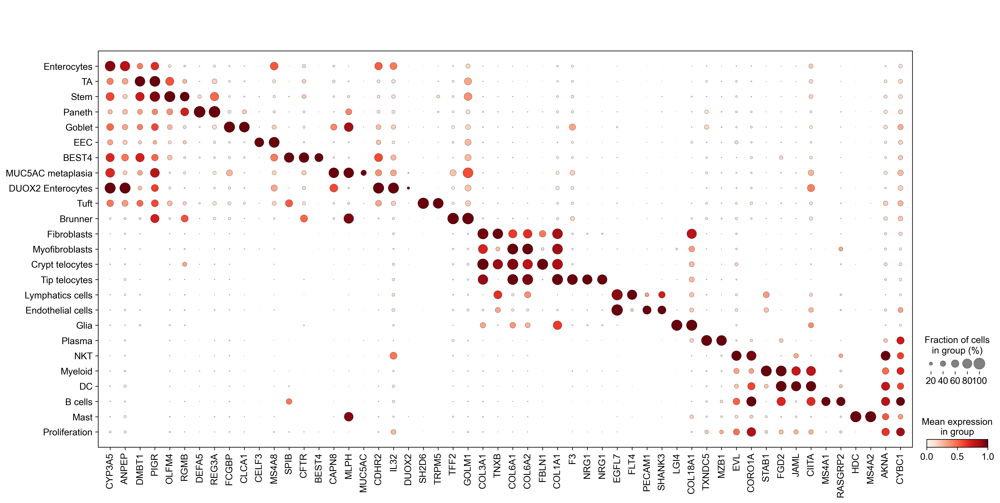

In [24]:
tmp_adata = adata.copy()
# tmp_adata.obs['cell_type_lvl2'] = tmp_adata.obs['cell_type_lvl2'].cat.reorder_categories(list(top_markers.keys()), ordered=True)
# rename some cell types
tmp_adata.obs['cell_type_lvl2'] = tmp_adata.obs['cell_type_lvl2'].str.replace("_", " ")
# also in ordered_cell_type
ordered_cell_types = [ct.replace("_", " ") for ct in ordered_cell_types]
tmp_adata.obs['cell_type_lvl2'] = tmp_adata.obs['cell_type_lvl2'].astype('category')
tmp_adata.obs['cell_type_lvl2'] = tmp_adata.obs['cell_type_lvl2'].cat.reorder_categories(ordered_cell_types, ordered=True)

fig,ax = plt.subplots(figsize=(20,10), dpi=300)
sc.pl.dotplot(tmp_adata, var_names=top_markers_list, groupby='cell_type_lvl2', layer='log_zscore',
                cmap='Reds',show=False, ax=ax, standard_scale='var',)
export_path = f"{cell_types_fig_save_path}/supp_fig_1D_10x_flex_lvl2_celltypes_marker_genes_dotplot.pdf"
plt.gcf().savefig(export_path, bbox_inches='tight', dpi=300)

plt.show()

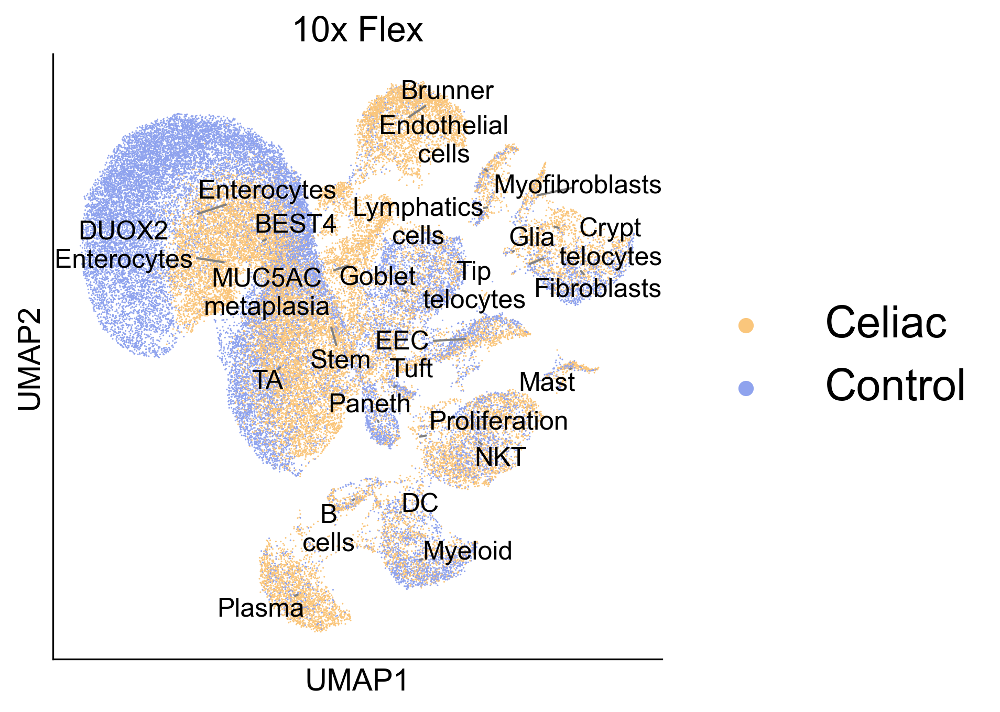

In [25]:
ADD_WHITE_OUTLINE = False

FIG_SIZE = (5, 5)
color_pallette = {"control": "#8fa3ee", "celiac": "#fac67c"}
fig,ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
sc.pl.umap(adata, color=['clinical_group'], palette=color_pallette, show=False,ax=ax, legend_fontsize='x-large',legend_fontoutline=1)

# add texts of cell_type_lvl2
for cell_type in adata.obs['cell_type_lvl2'].unique():
    x = np.median(adata.obsm['X_umap'][adata.obs['cell_type_lvl2'] == cell_type, 0])
    y = np.median(adata.obsm['X_umap'][adata.obs['cell_type_lvl2'] == cell_type, 1])

    if ADD_WHITE_OUTLINE:
        ax.text(x, y, cell_type.replace("_", "\n"), fontsize=12, weight='bold', color='black', ha='center', va='center',
            path_effects=[mpl.patheffects.withStroke(linewidth=1, foreground='white')])
    else:
        ax.text(x, y, cell_type.replace("_", "\n"), fontsize=12, weight='bold', color='black', ha='center', va='center',)
            # path_effects=[mpl.patheffects.withStroke(linewidth=1, foreground='white')])

# use text adjust
adjust_text(ax.texts, arrowprops=dict(arrowstyle='-', color='gray'))

# capitalize legend
for text in ax.legend_.get_texts():
    text.set_text(text.get_text().capitalize())

# rasterize axes
ax.collections[0].set_rasterized(True)

plt.title("10x Flex")
sns.despine()
# plt.tight_layout()
plt.show()
fig.savefig(fig1_save_path+"/Fig_1E_cell_types_on_group_umap.pdf", bbox_inches='tight')

### DGE MUC5AC metaplasia vs other enterocytes

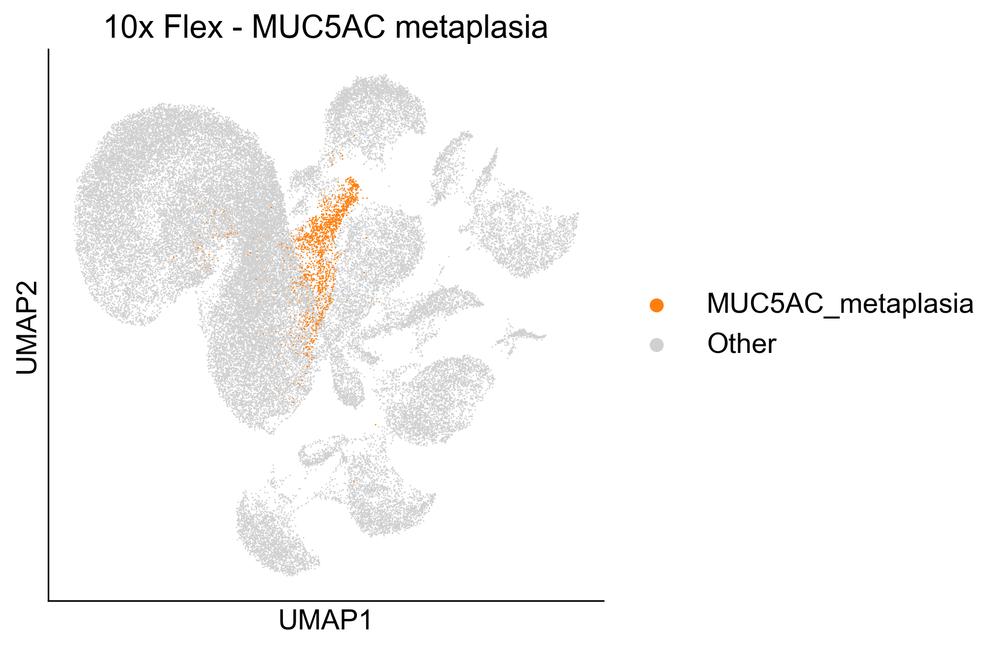

In [26]:
adata_tmp = adata.copy()
adata_tmp.obs['group_positive'] = adata_tmp.obs['cell_type_lvl2'].astype('str')
# make Enterocytes True 
adata_tmp.obs['group_positive'] = adata_tmp.obs['group_positive'] == 'MUC5AC_metaplasia'
# map True and False to "Enterocytes" and "Other"
adata_tmp.obs['group_positive'] = adata_tmp.obs['group_positive'].map({True: "MUC5AC_metaplasia", False: "Other"})
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
sns.despine()
sc.pl.umap(adata_tmp, color=['group_positive'], palette={"MUC5AC_metaplasia": "#ff7f0eff", "Other": "#d0d0d0"}, ax=ax, show=False)

# # add line to UMAP x and y
# ax.axhline(4, color='gray', linestyle='-')
# ax.axvline(2, color='gray', linestyle='--')

# rasterize
for coll in ax.collections:
    coll.set_rasterized(True)

# ax.get_legend().remove()
plt.title("10x Flex - MUC5AC metaplasia")
# plt.tight_layout()
plt.show()

# export pdf
fig.savefig(fig4_save_path+"/fig_4_MUC5AC_metaplasia_umap.pdf", bbox_inches='tight')


In [27]:
sample_annot_df_tmp = sample_annot_df.copy()
# Ensure the index of sample_annot_df matches the 'ST_' format
if not sample_annot_df_tmp.index.str.startswith("ST_").any():
	sample_annot_df_tmp.index = sample_annot_df_tmp.index.str.replace("P", "ST_")
df_muc5ac_stats = pd.DataFrame(adata.obs.sample_name.value_counts())
# add clinical_group_data
df_muc5ac_stats['clinical_group'] = np.nan
for sample in df_muc5ac_stats.index:
    df_muc5ac_stats.loc[sample, 'clinical_group'] = sample_annot_df_tmp.loc[sample, 'Diagnosis']
    # epithelial compartment cells
    epi_ad = adata[(adata.obs['cell_type_lvl1'] == 'Epithelium') & (adata.obs['sample_name'] == sample)].copy()
    epi_cells_counts = epi_ad.n_obs


    df_muc5ac_stats.loc[sample, 'epithelial_cells'] = epi_cells_counts
    muc5ac_ad = epi_ad[epi_ad.obs['cell_type_lvl2'] == 'MUC5AC_metaplasia'].copy()
    muc5ac_fraction = muc5ac_ad.n_obs / epi_cells_counts

    df_muc5ac_stats.loc[sample, 'MUC5AC_metaplasia_cells'] = muc5ac_ad.n_obs
    df_muc5ac_stats.loc[sample, 'muc5ac_fraction'] = muc5ac_fraction
df_muc5ac_stats

,count,clinical_group,epithelial_cells,MUC5AC_metaplasia_cells,muc5ac_fraction
sample_name,,,,,
ST_072,10319,Celiac,5971.0,976.0,0.163457
ST_046,9668,Control,7981.0,5.0,0.000626
ST_076,7609,Celiac,6598.0,392.0,0.059412
ST_033,5940,Control,5706.0,0.0,0.000000
ST_038,5129,Control,3500.0,0.0,0.000000
ST_052,3752,Control,3538.0,0.0,0.000000
ST_004,3163,Celiac,2758.0,152.0,0.055112
ST_054,3061,Celiac,1922.0,93.0,0.048387
ST_123,1677,Control,1559.0,62.0,0.039769


In [28]:
ct_df = df_muc5ac_stats[df_muc5ac_stats['clinical_group'] == 'Control']
ct_sem = ct_df['muc5ac_fraction'].sem()
ct_mean = ct_df['muc5ac_fraction'].mean()
print(f"Control mean muc5ac fraction: {ct_mean:.4f}, SEM: {ct_sem:.4f}")

ced_df = df_muc5ac_stats[df_muc5ac_stats['clinical_group'] == 'Celiac']
ced_sem = ced_df['muc5ac_fraction'].sem()
ced_mean = ced_df['muc5ac_fraction'].mean()
print(f"Celiac mean muc5ac fraction: {ced_mean:.4f}, SEM: {ced_sem:.4f}")

# statistical test
stat, p_value = ranksums(ct_df['muc5ac_fraction'], ced_df['muc5ac_fraction'])
print(f"Wilcoxon rank-sum test p-value: {p_value:.4e}")

Control mean muc5ac fraction: 0.0081, SEM: 0.0079
Celiac mean muc5ac fraction: 0.0696, SEM: 0.0189
Wilcoxon rank-sum test p-value: 6.1699e-03


In [29]:
# how many samples have muc5ac_fraction > 0.01, stratified by clinical_group
for group in df_muc5ac_stats['clinical_group'].unique():
    n_samples = df_muc5ac_stats[df_muc5ac_stats['clinical_group'] == group].shape[0]
    n_samples_above_thresh = df_muc5ac_stats[(df_muc5ac_stats['clinical_group'] == group) & (df_muc5ac_stats['muc5ac_fraction'] > 0.01)].shape[0]
    print(f"{group}: {n_samples_above_thresh} out of {n_samples} samples have muc5ac_fraction > 0.01")

Celiac: 6 out of 6 samples have muc5ac_fraction > 0.01
Control: 1 out of 5 samples have muc5ac_fraction > 0.01


In [30]:
enterocytes_ad = adata[adata.obs['cell_type_lvl2'].isin(["Enterocytes","MUC5AC_metaplasia"]),:]
enterocytes_ad = enterocytes_ad[enterocytes_ad.obs['clinical_group']=='celiac',:]

100%|██████████| 2/2 [00:00<00:00,  8.78it/s]


(18129, 2)
(5469, 2)


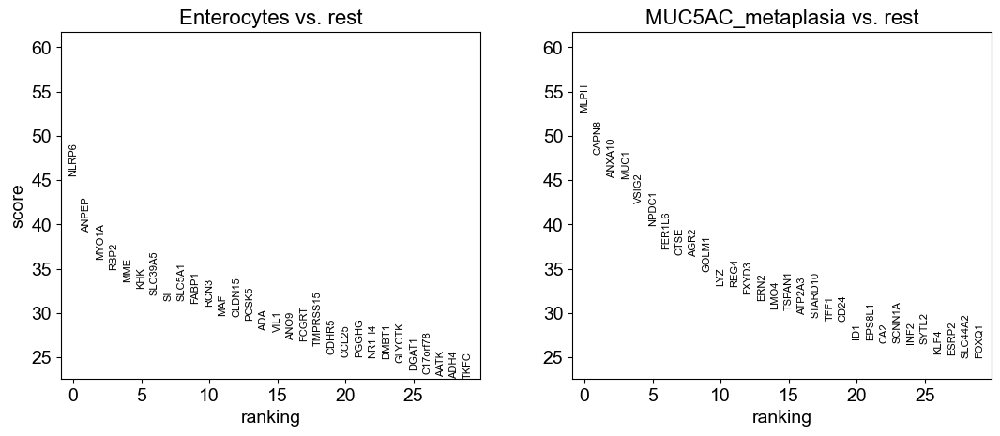

In [31]:
EXP_THRESH = 5e-5  # Define the expression threshold

mx_df = pd.DataFrame(index=enterocytes_ad.var_names)
for my_class in tqdm(enterocytes_ad.obs['cell_type_lvl2'].unique()):
    class_mask = enterocytes_ad.obs['cell_type_lvl2'] == my_class
    mx_df[my_class] = (np.array(enterocytes_ad.layers['mat_norm'].mean(axis=0)).squeeze())

# filter genes that are expressed at least EXP_THRESH in at least one group
print(mx_df.shape)
mx_df = mx_df[(mx_df > EXP_THRESH).any(axis=1)]  # Filter genes expressed above threshold in at least one group
print(mx_df.shape)

sc.tl.rank_genes_groups(enterocytes_ad,  groupby='cell_type_lvl2',  method='wilcoxon', layer='log_norm')
sc.pl.rank_genes_groups(enterocytes_ad,  groupby='cell_type_lvl2',  n_genes=30)
# enterocytes_ad

In [32]:
dge_df = sc.get.rank_genes_groups_df(enterocytes_ad, group='MUC5AC_metaplasia')
dge_df.index = dge_df['names']
dge_df = dge_df.loc[mx_df.index]

# set pvals_adj zeros to 1e-323
dge_df.loc[dge_df.pvals_adj == 0, 'pvals_adj'] = 1e-323

px.scatter(dge_df, x='logfoldchanges', y=-np.log10(dge_df['pvals_adj']) , hover_name='names', title='MUC5AC_metaplasic vs other enterocytes')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': '<b>%{hovertext}</b><br><br>logfoldchanges=%{x}<br>y=%{y}<extra></extra>',
              'hovertext': array(['NOC2L', 'PLEKHN1', 'ISG15', ..., 'MT-ND5', 'MT-ND6', 'MT-CYB'],
                                 shape=(5469,), dtype=object),
              'legendgroup': '',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'showlegend': False,
              'type': 'scattergl',
              'x': {'bdata': ('UfF5P8aegUDgGSw/JU72P5GKXD+qCp' ... 'u6v5r3rb85I6+/OWePvxVuTb+1h8a/'),
                    'dtype': 'f4'},
              'xaxis': 'x',
              'y': {'bdata': ('wxE6pb8wEEDxlDZpOyRGQBfj//f6yv' ... 'QyOEEsH0BAJ/8wYvwnQLbGOw2+pEVA'),
                    'dtype': 'f8'},
              'yaxis': 'y'}],
    'layout': {'legend': {'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'MUC5AC_metaplasic vs other enterocytes'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'logfoldchanges'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'y'}}}
})

In [33]:
genes_to_show = ["MUC5AC","GKN2","FOXQ1","TFF1","MUC1","SI",
"DMBT1","AGR2","NLRP6","ANPEP","CLDN18","SLC2A2","RBP2",
"VSIG2","MLPH","REG4","APOB", "MUCL3","SLC5A1","SLC6A19","ALDOB","APOA4"]

In [34]:
dge_df.loc["APOA4"]

names                APOA4
scores            -5.93844
logfoldchanges   -3.690221
pvals                  0.0
pvals_adj              0.0
Name: APOA4, dtype: object

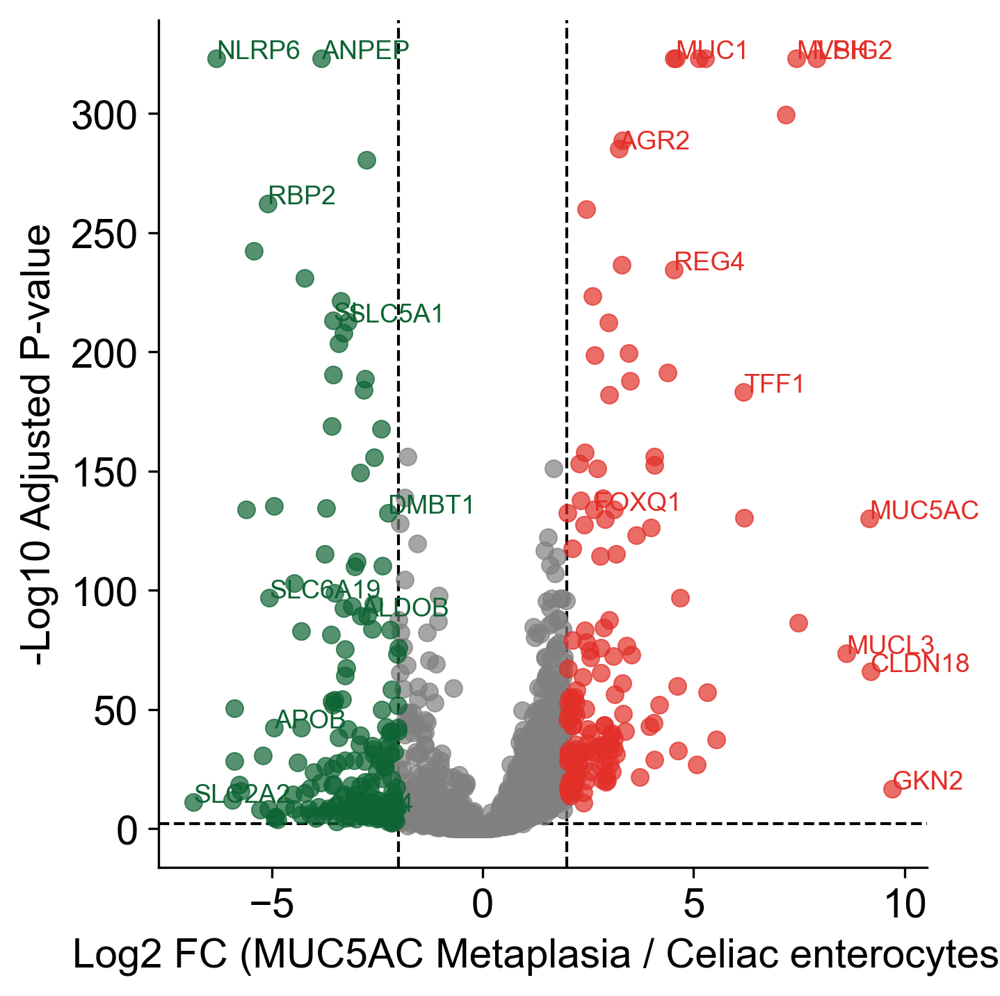

In [35]:
# plot volcano with TF highlighted
fig,ax = plt.subplots(figsize=(5,5),dpi=300)
# add names to TF genes above threshold of FC > 1.5 and adj p-value < 0.01
threshold_fc = 2
threshold_qval = 0.01
dge_df['significant'] = ( (np.abs(dge_df['logfoldchanges']) > threshold_fc) & (dge_df['pvals_adj'] < threshold_qval) )
dge_df['color'] = 'gray'

# plot the non significant genes first
sns.scatterplot(
    dge_df[dge_df['significant'] == False],
    x='logfoldchanges',
    # y=-np.log10(dge_df[dge_df['TF'] == False]['pvals_adj']),
    y=-np.log10(dge_df['pvals_adj']),
    color='gray',
    alpha=0.7,
    edgecolor=None
)

# plot the metaplasitic genes
sns.scatterplot(
    dge_df[(dge_df['significant'] == True) & (dge_df['logfoldchanges'] > 0)],
    x='logfoldchanges',
    # y=-np.log10(dge_df[dge_df['TF'] == False]['pvals_adj']),
    y=-np.log10(dge_df['pvals_adj']),
    color='#E22F28',
    alpha=0.7,
    edgecolor=None
)
dge_df.loc[(dge_df['significant'] == True) & (dge_df['logfoldchanges'] > 0), 'color'] = '#E22F28'

# plot enterocytes genes
sns.scatterplot(
    dge_df[(dge_df['significant'] == True) & (dge_df['logfoldchanges'] < 0)],
    x='logfoldchanges',
    # y=-np.log10(dge_df[dge_df['TF'] == False]['pvals_adj']),
    y=-np.log10(dge_df['pvals_adj']),
    color='#0e6433',
    alpha=0.7,
    edgecolor=None
)
dge_df.loc[(dge_df['significant'] == True) & (dge_df['logfoldchanges'] < 0), 'color'] = '#0e6433'

texts = []
for i, row in dge_df.loc[genes_to_show].iterrows():
    if abs(row['logfoldchanges']) > threshold_fc and row['pvals_adj'] < threshold_qval:
        texts.append(
            plt.text(
            row['logfoldchanges'],
            -np.log10(row['pvals_adj']),
            f"{row['names']}",
            fontsize=9,
            fontproperties=FontProperties(weight=1000),
            color=row['color'],
            # path_effects=[mpl.patheffects.withStroke(linewidth=1.5, foreground='white')]
            )
        )
# adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))

# add lines for thresholds
plt.axhline(-np.log10(threshold_qval), color='black', linestyle='--', lw=1, zorder=0)
plt.axvline(threshold_fc, color='black', linestyle='--', lw=1, zorder=0)
plt.axvline(-threshold_fc, color='black', linestyle='--', lw=1, zorder=0)

# set xlim +- 10
# plt.xlim(-10, 10)

plt.xlabel('Log2 FC (MUC5AC Metaplasia / Celiac enterocytes)')
plt.ylabel('-Log10 Adjusted P-value')
plt.legend([], [], frameon=False)

# raserize
for coll in ax.collections:
    coll.set_rasterized(True)

sns.despine()
plt.tight_layout()
plt.show()

# save figure
fig.savefig(fig4_save_path+"/fig_4D_MUC5AC_metaplasia_volcano.pdf", bbox_inches='tight')

In [36]:
# dge T cells celiac vs controls
# tmp_ad = adata[adata.obs['cell_type_lvl2'] == "NKT",:].copy()
# sc.tl.rank_genes_groups(tmp_ad, groupby='clinical_group', method='wilcoxon', layer='log_norm')
# dge_df = sc.get.rank_genes_groups_df(tmp_ad, group='celiac')

# dge_df.index = dge_df['names']
# dge_df = dge_df.loc[mx_df.index]

# px.scatter(dge_df, x='logfoldchanges', y=-np.log10(dge_df['pvals_adj']) , hover_name='names', title='MUC5AC_metaplasia vs other enterocytes')


In [37]:
dge_df.set_index('names',inplace=False).loc[:,'scores']

names
NOC2L        4.368909
PLEKHN1     14.384266
ISG15        2.330348
AGRN        18.309393
C1orf159     4.037129
              ...    
MT-ND4L    -11.247616
MT-ND4     -12.751661
MT-ND5      -6.075492
MT-ND6      -7.529428
MT-CYB     -14.221978
Name: scores, Length: 5469, dtype: float32

In [38]:
selected_gene_set = "KEGG_2021_Human" # "MSigDB_Hallmark_2020"
pre_res = gp.prerank(rnk = dge_df.set_index('names',inplace=False).loc[:,'scores'],
                    gene_sets=selected_gene_set,threads=4, min_size=5,max_size=1000,
                    permutation_num=1000, outdir=None, seed=6,verbose=True)

print(pre_res.res2d.shape)

2026-01-20 12:18:18,434 [WARNING] Duplicated values found in preranked stats: 0.27% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


2026-01-20 12:18:18,436 [INFO] Parsing data files for GSEA.............................
2026-01-20 12:18:18,451 [INFO] Enrichr library gene sets already downloaded in: /home/talbarka/.cache/gseapy, use local file
2026-01-20 12:18:18,480 [INFO] 0020 gene_sets have been filtered out when max_size=1000 and min_size=5
2026-01-20 12:18:18,482 [INFO] 0300 gene_sets used for further statistical testing.....
2026-01-20 12:18:18,483 [INFO] Start to run GSEA...Might take a while..................
2026-01-20 12:18:22,296 [INFO] Congratulations. GSEApy runs successfully................



(300, 10)


Q-value thresh: 0.2


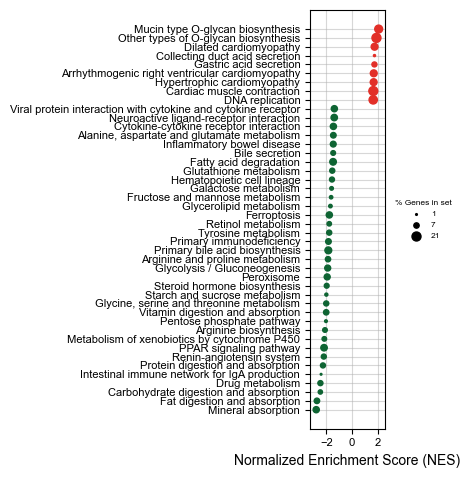

In [39]:
GSEA_Q_THRESH = 0.2
import importlib
importlib.reload(plot_gsea)
if pre_res.res2d['FDR q-val'].min() < GSEA_Q_THRESH:
    [_,fig] = plot_gsea.plot_GSEA(pre_res.res2d, qval_thresh=GSEA_Q_THRESH, return_figure=True, legend_round=0,pos_color='#E22F28', neg_color='#0e6433')
    fig.savefig(supp_metaplasia_save_path+"/Supp_MUC5AC_metaplasia_GSEA.pdf", bbox_inches='tight',)
else:
    print("No significant gene sets")

Q-value thresh: 0.2


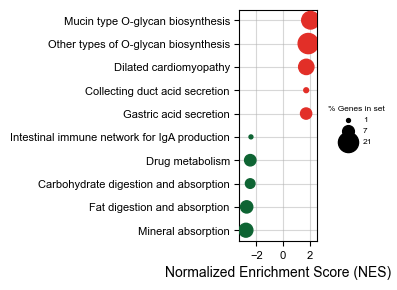

In [40]:
tmp_res = pre_res.res2d[pre_res.res2d['FDR q-val'] < GSEA_Q_THRESH].sort_values('NES', ascending=False)

# set NES to be float
tmp_res['NES'] = tmp_res['NES'].astype(float)

N_EXTREME = 5
# select the most extreme positive and negative NES
extreme_sets = pd.concat([
    tmp_res[tmp_res['NES'] > 0].nlargest(N_EXTREME, 'NES'),
    tmp_res[tmp_res['NES'] < 0].nsmallest(N_EXTREME, 'NES')
])

[_,fig] = plot_gsea.plot_GSEA(extreme_sets, qval_thresh=GSEA_Q_THRESH, fig_size=(1,3),
                               return_figure=True, bubble_scale=10, row_spacing=0.5, legend_round=0,
                               pos_color='#E22F28', neg_color='#0e6433')

# change xlim
ax = fig.axes[0]
ax.set_xlim(-3.9, 3.9)
ax.set_ylim(-0.3, 4.8)

# save fig
fig.savefig(fig4_save_path+"/fig_4E_MUC5AC_metaplasia_GSEA_short.pdf", bbox_inches='tight')

In [41]:
print(datetime.now())

2026-01-20 12:18:28.559234


In [42]:
print(session_info2.session_info(dependencies=True))

pandas	2.3.1
plotly	6.2.0
scanpy	1.11.3
seaborn	0.13.2
matplotlib	3.10.3
numpy	2.2.6
adjustText	1.3.0
tqdm	4.67.1
gseapy	1.1.9
scipy	1.15.3
scikit-learn	1.7.1
statsmodels	0.14.5
dill	0.4.0
anndata	0.12.0
----	----
importlib_metadata	8.7.0
parso	0.8.4
platformdirs	4.3.8
sphinxcontrib-htmlhelp	2.1.0
llvmlite	0.44.0
fonttools	4.59.0
charset-normalizer	3.4.2
zarr	2.18.7
packaging	25.0
Deprecated	1.2.18
MarkupSafe	3.0.2
executing	2.2.0
sphinxcontrib-serializinghtml	2.0.0
six	1.17.0
asciitree	0.3.3
jupyter_core	5.8.1
narwhals	1.47.1
wrapt	1.17.2
python-dateutil	2.9.0.post0
pure_eval	0.2.3
zipp	3.23.0
sphinxcontrib-qthelp	2.0.0
jedi	0.19.2
numba	0.61.2
texttable	1.7.0
PyYAML	6.0.2
debugpy	1.8.15
wcwidth	0.2.13
threadpoolctl	3.6.0
legacy-api-wrap	1.4.1
comm	0.2.2
typing_extensions	4.14.1
joblib	1.5.1
tornado	6.5.1
prompt_toolkit	3.0.51
certifi	2025.7.14 (2025.07.14)
pillow	11.3.0
igraph	0.11.9
cloudpickle	3.1.1
sphinxcontrib-devhelp	2.0.0
Jinja2	3.1.6
xarray	2025.9.0
pyzmq	27.0.0
natsort	8.4.0